In [4]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import os
from PIL import Image
from IPython.display import display
from pathlib import Path
from tqdm import tqdm
import matplotlib.pyplot as plt
import sys
from pv_vision.transform_crop.solarmodule import MaskModule
from ipywidgets import interactive, widgets, Layout
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry, SamPredictor
%matplotlib inline 


In [22]:
# color RGB
green = (76, 108, 67)
purple = (124,124,186)
blue = (63, 160, 192)
grey = (105, 105, 105)

In [2]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    

In [3]:
# image_path = "/home/ne19695/Bingru Xin/2-data/field/HSB22094600064.JPG"
image_path = "/home/ne19695/Bingru Xin/2-data/test/test_4.jpg"
# image_path = "/home/ne19695/Bingru Xin/2-data/test/test_4.jpg"
dir_path = '/home/ne19695/Bingru Xin/2-data/test_400/'
dirname, filename = os.path.split(image_path)
print(dirname)
print(filename)
image = cv2.imread(image_path)

/home/ne19695/Bingru Xin/2-data/test
test_4.jpg


(-0.5, 5999.5, 3999.5, -0.5)

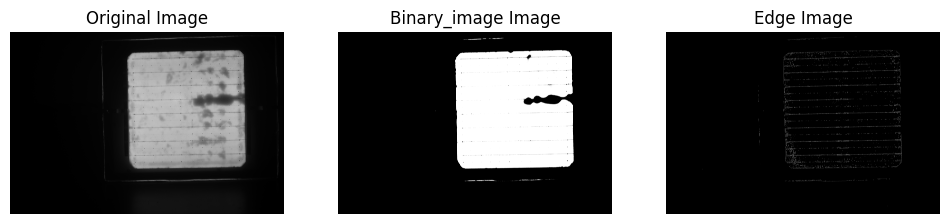

In [25]:
gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# _,binary_image = cv2.threshold(gray_img,40,256,cv2.THRESH_BINARY)
_,binary_image = cv2.threshold(gray_img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
edges = cv2.Canny(gray_img, threshold1=50, threshold2=150)
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(gray_img, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Binary_image Image')
plt.imshow(binary_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Edge Image')
plt.imshow(edges, cmap='gray')
plt.axis('off')


(-0.5, 5999.5, 3999.5, -0.5)

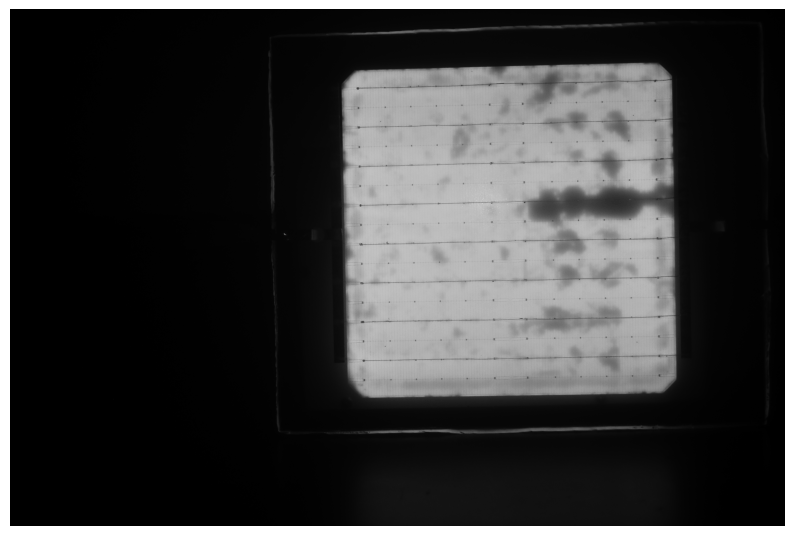

In [26]:
plt.figure(figsize=(10, 10))
plt.imshow(gray_img, cmap='gray')
plt.axis('off')

(-0.5, 5999.5, 3999.5, -0.5)

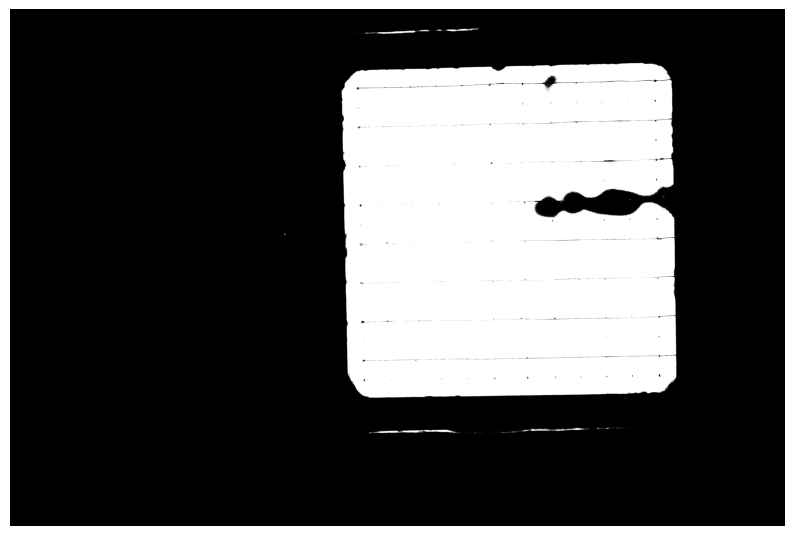

In [27]:
plt.figure(figsize=(10, 10))
plt.imshow(binary_image, cmap='gray')
plt.axis('off')

(-0.5, 5999.5, 3999.5, -0.5)

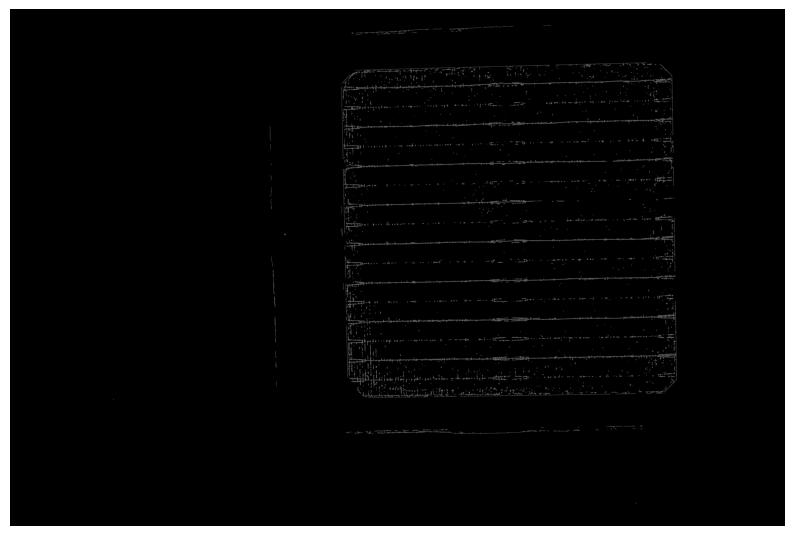

In [28]:
plt.figure(figsize=(10, 10))
plt.imshow(edges, cmap='gray')
plt.axis('off')

PV box is: [2558, 407, 5164, 3012]


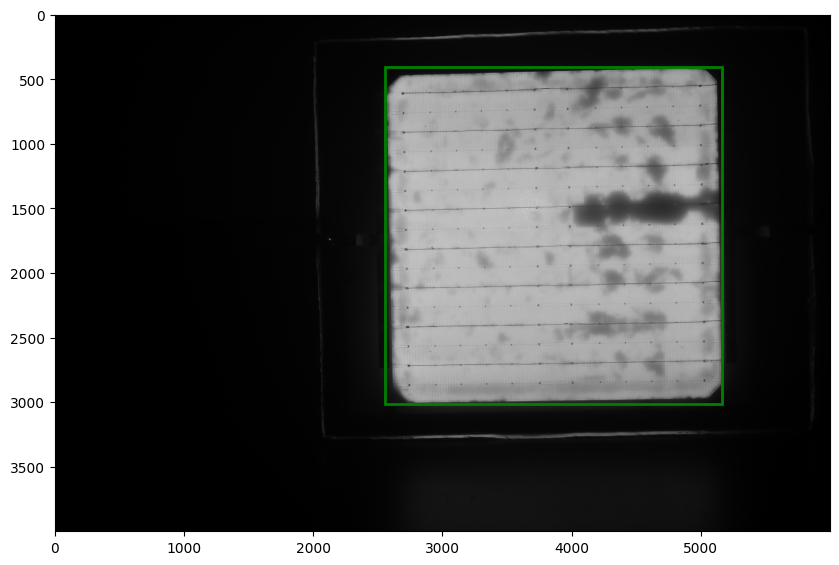

In [29]:
contours, hierarchy = cv2.findContours(binary_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
if not contours:
   raise ValueError("No contours found, please check the parameters for image and edge detection.")
max_contour = max(contours, key=cv2.contourArea)
x, y, w, h = cv2.boundingRect(max_contour)
box = [x - 10, y - 10 , x + w + 5, y + h + 5]
# box = [270, 230, 1750, 1770]
input_box = np.array(box)
print(f"PV box is: {box}")
plt.figure(figsize=(10, 10))
plt.imshow(gray_img,cmap='gray')

show_box(input_box, plt.gca())



In [30]:

sam_checkpoint = "/home/ne19695/checkpoints/sam_vit_l_0b3195.pth"
model_type = "vit_l"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)

sam.to(device=device)

# mask_generator = SamAutomaticMaskGenerator(sam)
predictor = SamPredictor(sam)
gray_RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
predictor.set_image(gray_RGB_img)

masks, scores, logits = predictor.predict(box=input_box)
if masks is None or len(masks) == 0:
   raise ValueError("There is no mask, please check your box or model")

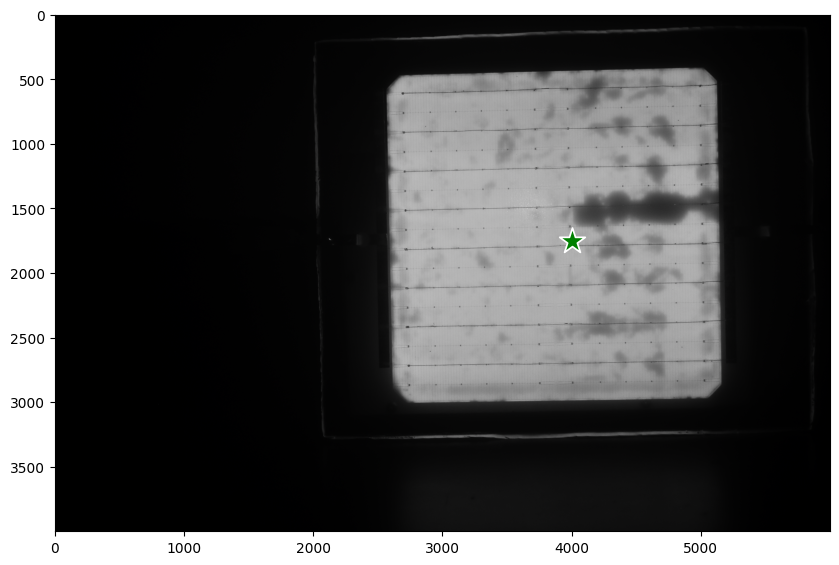

In [31]:
# input_point
input_point = np.array([(4000,1750)])
input_label = np.array([1])

plt.figure(figsize=(10, 10))
plt.imshow(gray_RGB_img,cmap='gray')
show_points(input_point,input_label, plt.gca())
plt.axis('on')
plt.show()


In [32]:
masks_2, scores_2, logits_2 = predictor.predict(point_coords = input_point, point_labels = input_label, multimask_output = True,)

In [33]:
masks_2.shape

(3, 4000, 6000)

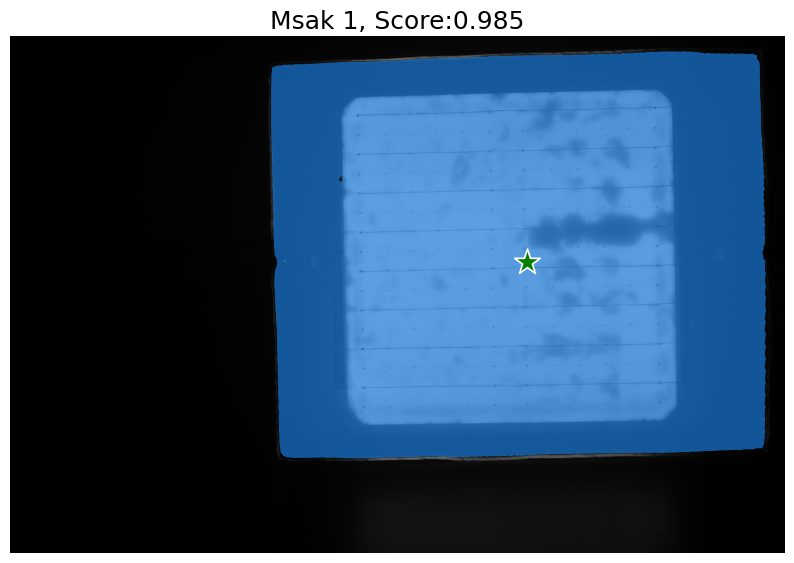

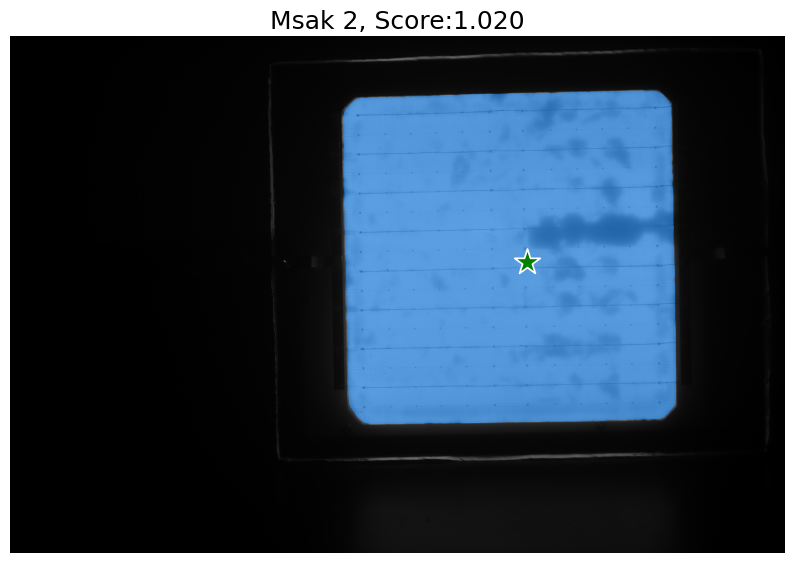

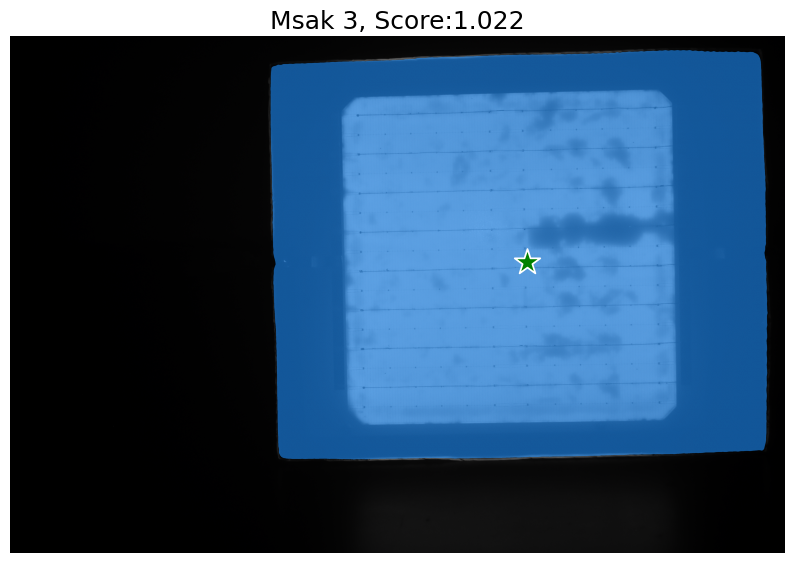

In [34]:
for i,(mask,score) in enumerate(zip(masks_2,scores_2)):
    plt.figure(figsize=(10,10))
    plt.imshow(gray_RGB_img)
    show_mask(mask, plt.gca())
    show_points(input_point,input_label, plt.gca())
    plt.title(f"Msak {i+1}, Score:{score:.3f}",fontsize=18)
    plt.axis('off')
    plt.show()


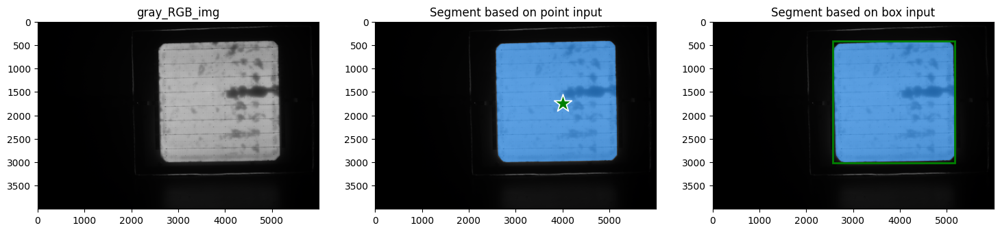

In [35]:
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.title('gray_RGB_img')
plt.imshow(gray_RGB_img, cmap='gray')

plt.subplot(1, 3, 2)
plt.imshow(gray_RGB_img)
plt.title('Segment based on point input')
show_mask(masks_2[1], plt.gca())
show_points(input_point,input_label, plt.gca())

plt.subplot(1, 3, 3)
plt.imshow(gray_RGB_img)
plt.title('Segment based on box input')
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())

plt.show()

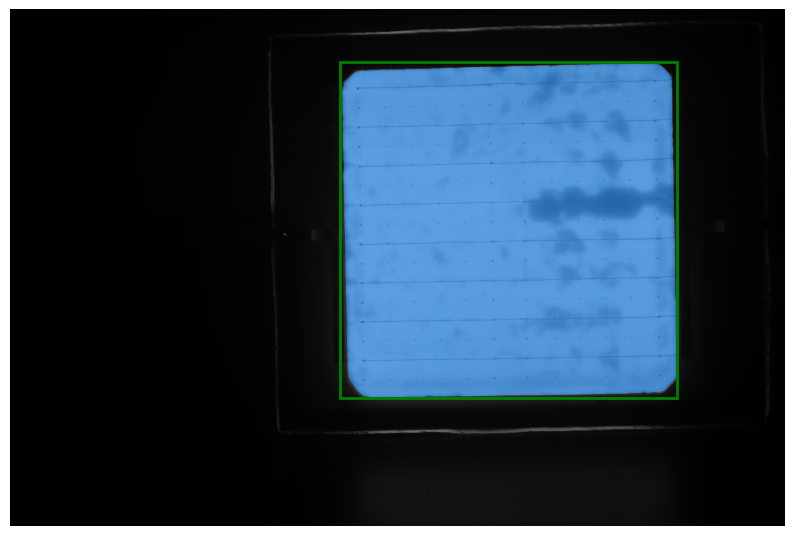

In [36]:
plt.figure(figsize=(10, 10))
plt.imshow(gray_RGB_img,cmap='gray')
plt.axis('off')
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())

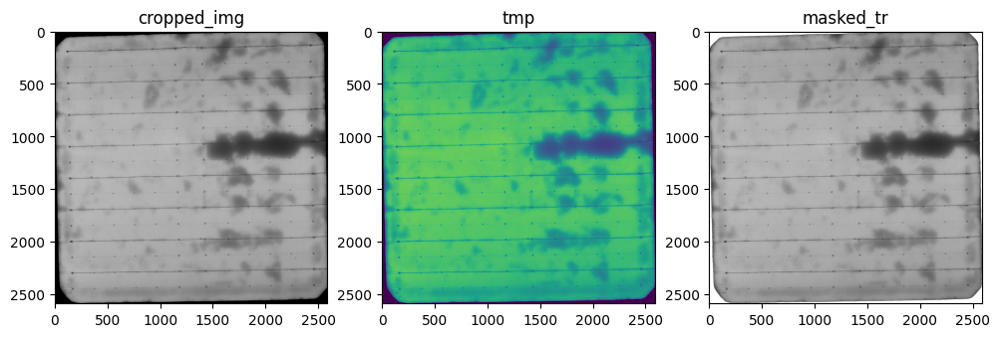

In [37]:
mask = masks[0]
mask = mask.astype(np.uint8) * 255
masked_img = cv2.bitwise_and(gray_RGB_img , gray_RGB_img , mask=mask)

contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
x, y, w, h = cv2.boundingRect(contours[0])
cropped_img = masked_img[y:y+h, x:x+w]

tmp = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2GRAY)
_,alpha = cv2.threshold(tmp,0,255,cv2.THRESH_BINARY)
b, g, r = cv2.split(cropped_img)
rgba = [b,g,r, alpha]
masked_tr = cv2.merge(rgba,4)
# masked_tr[mask,3] = 0

plt.figure(figsize=(12, 10))
plt.subplot(1, 3, 1)
plt.title('cropped_img')
plt.imshow(cropped_img)



plt.subplot(1, 3, 2)
plt.title('tmp')
plt.imshow(tmp)



plt.subplot(1, 3, 3)
plt.title('masked_tr')
plt.imshow(masked_tr)

plt.show()

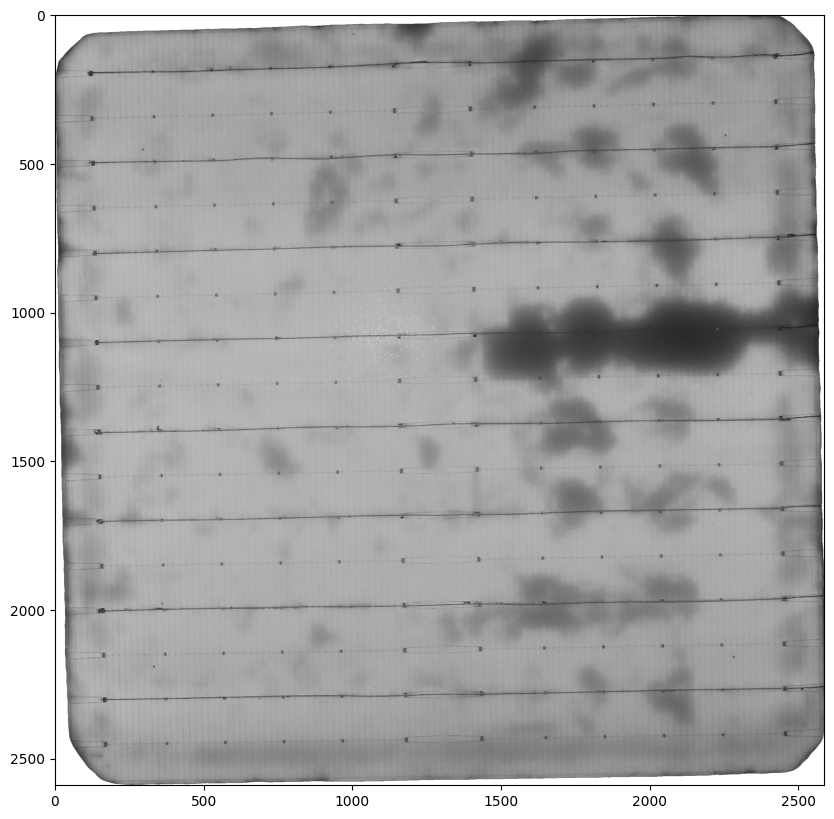

In [38]:
plt.figure(figsize=(10, 10))
plt.imshow(masked_tr)
plt.show()

In [39]:
cv2.imwrite(dir_path + filename[0:-4] + '_sam.png', masked_tr)


True

In [40]:
import cv2 as cv
image = cv2.imread(dir_path + filename[0:-4] + '_sam.png', 0 )
#tmp_GRAY = cv.cvtColor(tmp, cv2.IMREAD_GRAYSCALE)

# raw_module = MaskModule(image, 1, 1, 8) # 6 rows && 6 columns && 3 busbar
raw_module = MaskModule(image, 1, 1, 3)
def update_mask(thre):
    mask = raw_module.load_mask(thre=thre, output=True)
    plt.figure(figsize=(8, 6))
    plt.imshow(mask, "gray")

thre = widgets.FloatSlider(value=0.05, min=0, max=1, step=0.01)

interactive(update_mask,
            thre=thre, description="Threshold")



interactive(children=(FloatSlider(value=0.05, description='thre', max=1.0, step=0.01), Output()), _dom_classes…

In [41]:
def update_corner(mode):
    corners = raw_module.corner_detection_cont(output=True, mode=mode)
    x, y = zip(*corners)

    plt.figure(figsize=(8, 6))
    plt.imshow(raw_module.mask, 'gray')
    plt.scatter(x, y, c='r',linewidths = 7)

mode=widgets.IntSlider(value=4, min=0, max=4, step=1)
interactive(update_corner,
            mode=mode)

interactive(children=(IntSlider(value=4, description='mode', max=4), Output()), _dom_classes=('widget-interact…

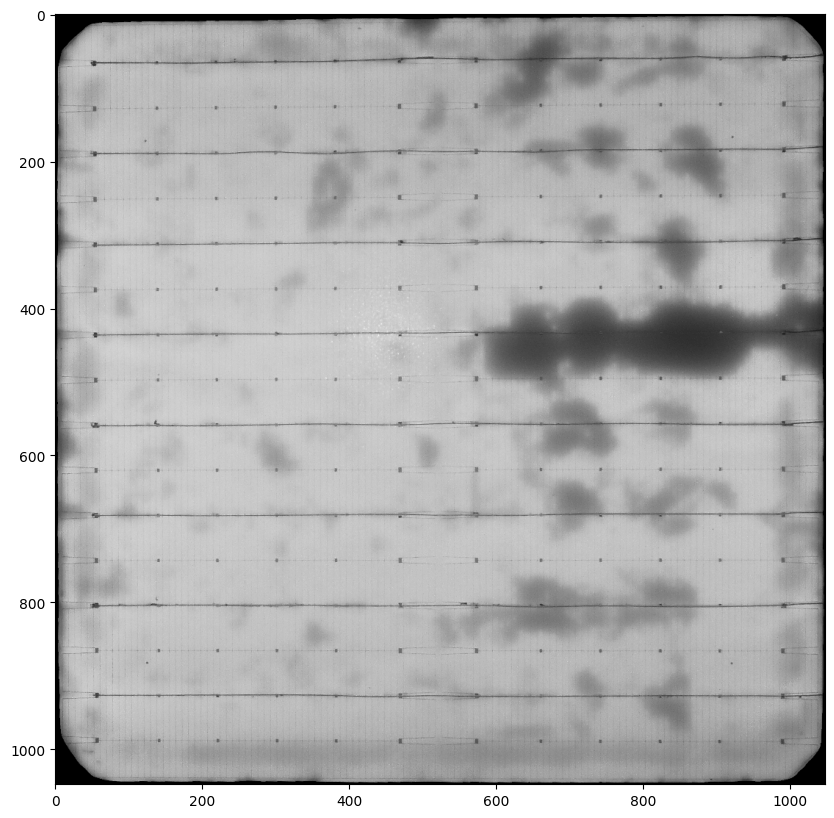

In [42]:
# cellsize can be adjusted(128, 256, 512 and so on)
img_transformed_1048 = raw_module.transform(cellsize=1048, img_only=True)
plt.figure(figsize=(10, 10))
plt.imshow(img_transformed_1048, 'gray')

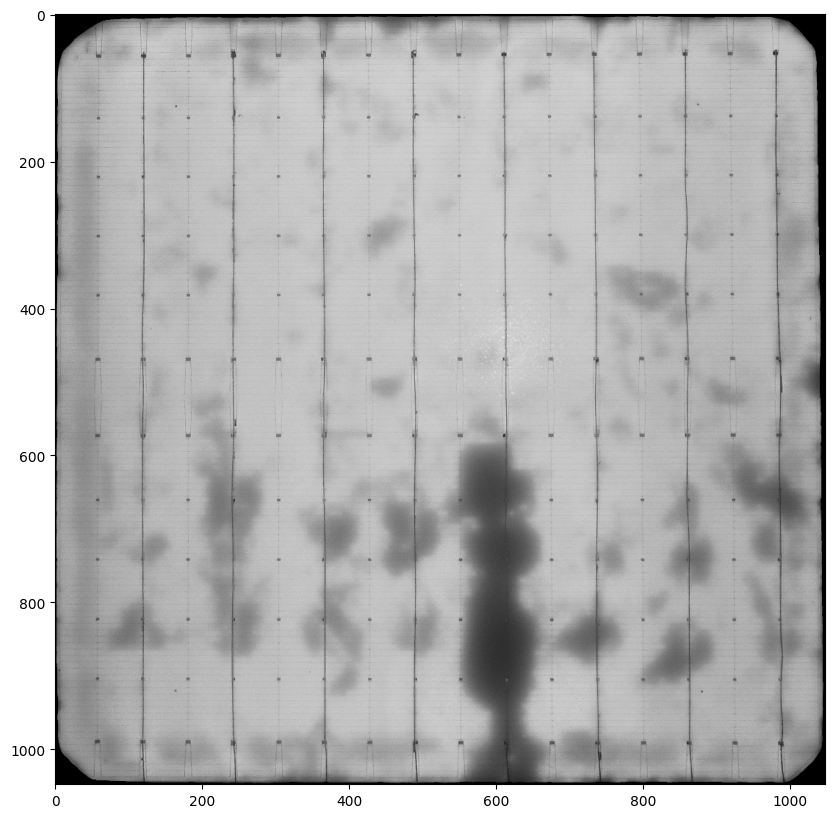

In [43]:
rotation = True
if rotation:
    img_rot_1048 = np.rot90(img_transformed_1048,-1)
    plt.figure(figsize=(10, 10))
    plt.imshow(img_rot_1048, 'gray')


In [44]:
# save transform_image
cv2.imwrite(dir_path + filename[0:-4] + '_transform.png', img_rot_1048)

True

total percent of busbar is 1.89, and corrosion is 33.75


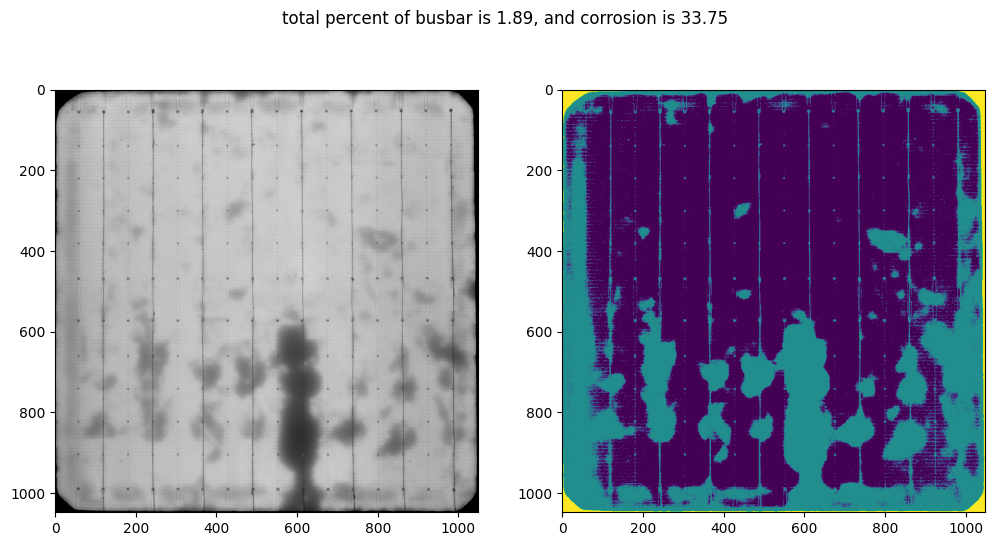

In [45]:
#calculate region based on threshold

new_img = cv2.imread(dir_path + filename[0:-4] + '_transform.png')

# new_img = cv2.imread(dir_path+filename[0:-4]+'.png')
	
new_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)

busbar_thres = 20
retal = cv.mean(new_img)
# corrosion_thres = 125
corrosion_thres = retal[0]

# counting the number of pixels
number_of_total_pix = np.sum(new_img<=255)
number_of_busbar_pix = np.sum(new_img < busbar_thres)
number_of_good_pix = np.sum(new_img > corrosion_thres)
busbar_ratio = number_of_busbar_pix/number_of_total_pix*100
corrosion_ratio = (1-number_of_good_pix/number_of_total_pix)*100
# print('total ratio of busbar is ', number_of_busbar_pix/number_of_total_pix, ', and total ratio of corrosion is ', 1-number_of_good_pix/number_of_total_pix)

#create a mask based on thresholds
corr_mask =np.zeros(np.shape(new_img))
for i in range(0, np.shape(new_img)[0]):
    for j in range(0, np.shape(new_img)[1]):
        if new_img[i,j]< busbar_thres:
            corr_mask[i,j] = 255
        elif new_img[i,j] > corrosion_thres:
            corr_mask[i,j] = 0
        else:
            corr_mask[i,j] = 125
# plt.figure(figsize=(20, 10))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(new_img,cmap='gray')
ax2.imshow(corr_mask)
fig.suptitle('total percent of busbar is '+ str('%.2f' % busbar_ratio) + ', and corrosion is '+ str('%.2f' % corrosion_ratio))
print('total percent of busbar is '+ str('%.2f' % busbar_ratio) + ', and corrosion is '+ str('%.2f' % corrosion_ratio))


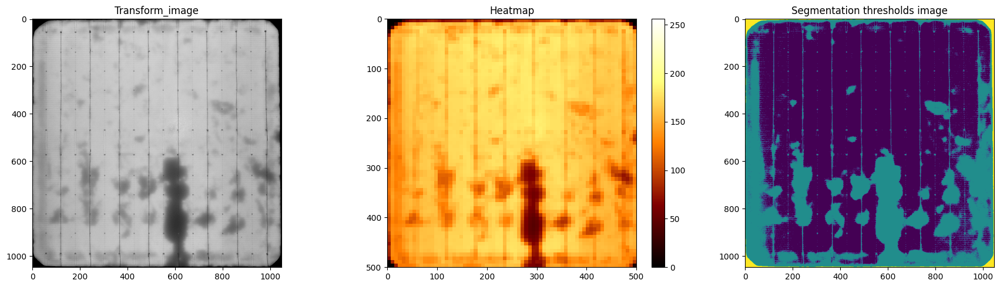

In [46]:
# heatmap plt
import matplotlib.colors as mcolors

grid_size = 15
np_img = np.asarray(cv2.imread(dir_path + filename[0:-4] + '_transform.png'))
height, width, _ =  np_img.shape
grid_height = height // grid_size 
grid_width = width // grid_size 

heatmap = np.zeros((grid_height,grid_width))

for i in range(grid_height):
    for j in range(grid_width):
        start_h = i * grid_size
        end_h = (i + 1) * grid_size
        start_w = j * grid_size
        end_w = (j + 1) * grid_size

        grid_pixels = np_img[start_h:end_h, start_w:end_w, : ]
        avg_value = np.mean(grid_pixels)

        heatmap[i , j] = avg_value

# Grayscale value
img = new_img.copy()

greyScale_map = cv.calcHist([img], [0], None, [256], [1, 256]).squeeze()

plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
plt.title('Transform_image')
plt.imshow(new_img,cmap='gray')
# plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Segmentation thresholds image')
plt.imshow(corr_mask)
# plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Segmentation thresholds image')
plt.imshow(heatmap, cmap='afmhot', interpolation='nearest', norm=mcolors.Normalize(vmin=0,vmax=256),extent=[0,500,500,0])
plt.colorbar(fraction=0.05, pad=0.05)
plt.title('Heatmap')
# plt.axis('off')

'''
plt.subplot(2, 1, 2)
plt.bar(range(len(greyScale_map)), greyScale_map, color='gray')
plt.title('Pixel Intensity Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
'''
plt.tight_layout()
plt.show()


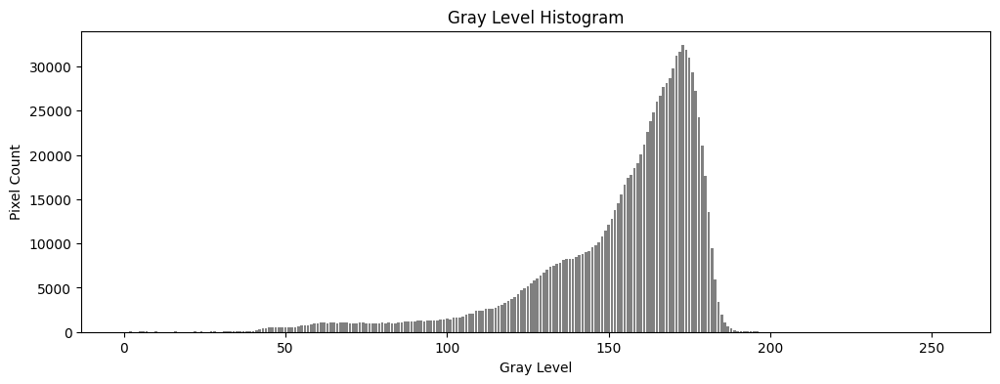

In [47]:
import cv2 as cv
import matplotlib.pyplot as plt
 
src = cv.imread(dir_path + filename[0:-4] + '_transform.png', 0)  # 直接以灰度图方式读入
img = src.copy()
 
# 统计灰度图
greyScale_map = cv.calcHist([img], [0], None, [256], [1, 256]).squeeze()
 
# 绘制灰度图
plt.figure(figsize=(12, 4), dpi=100)
plt.bar(range(len(greyScale_map)), greyScale_map, color='gray')
plt.xlabel('Gray Level')
plt.ylabel('Pixel Count')
plt.title('Gray Level Histogram')
plt.show()

Text(0.5, 1.0, 'Normalized brightness on verticle axis (Y-axis)')

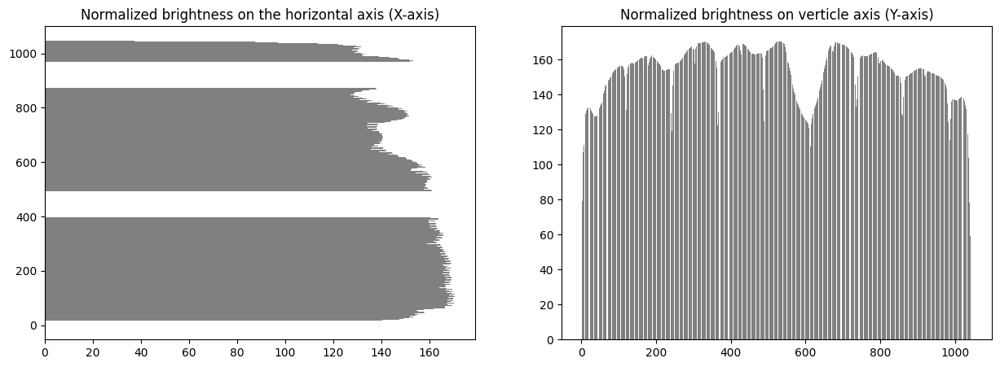

In [48]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15,5))
fig.subplots_adjust(hspace=0)
hor_norm = np.average(new_img, axis=1)
ver_norm = np.average(new_img, axis=0)

ax1.barh(range(0,len(hor_norm)), hor_norm,color='gray')
ax1.set_title('Normalized brightness on the horizontal axis (X-axis)')

ax2.bar(range(0, len(ver_norm)), ver_norm,color='gray')
ax2.set_title('Normalized brightness on verticle axis (Y-axis)')

Text(0.5, 1.0, 'Normalized brightness on verticle axis (Y-axis)')

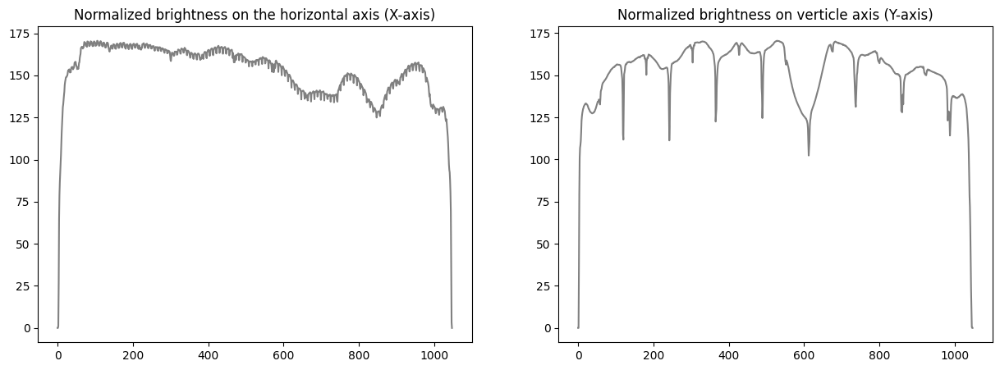

In [49]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15,5))
fig.subplots_adjust(hspace=0)
hor_norm = np.average(new_img, axis=1)
ver_norm = np.average(new_img, axis=0)

ax1.plot(range(0,len(hor_norm)), hor_norm, color='gray')
ax1.set_title('Normalized brightness on the horizontal axis (X-axis)')

ax2.plot(range(0, len(ver_norm)), ver_norm,color='gray')
ax2.set_title('Normalized brightness on verticle axis (Y-axis)')

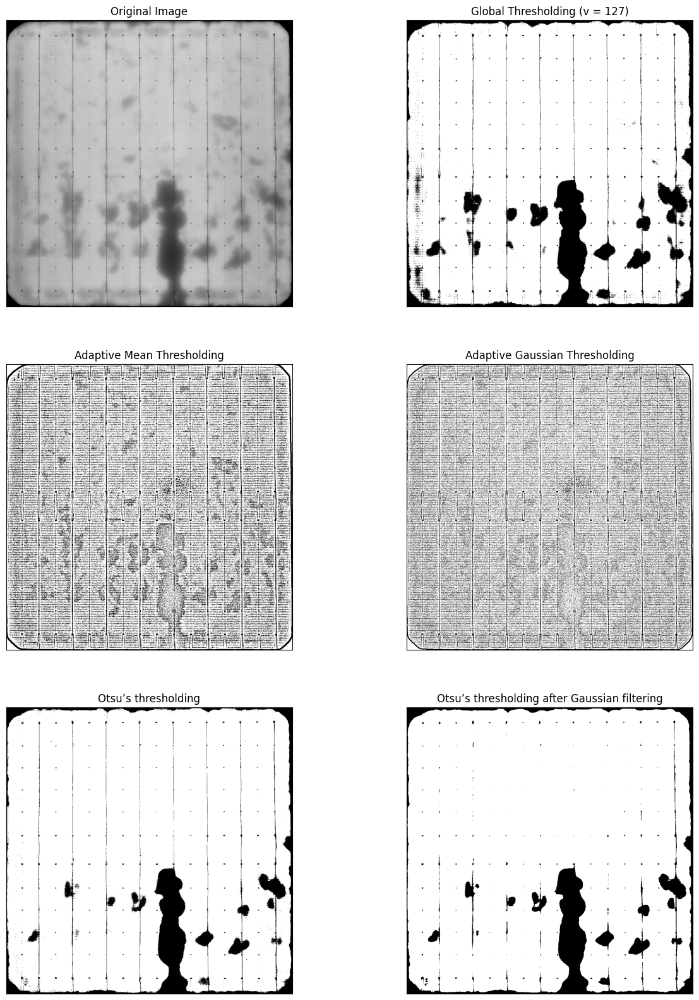

In [50]:
ret,th1 = cv.threshold(new_img,125,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(new_img ,255,cv.ADAPTIVE_THRESH_MEAN_C,\
            cv.THRESH_BINARY,11,2)
th3 = cv.adaptiveThreshold(new_img ,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv.THRESH_BINARY,11,2)
ret,th4 = cv.threshold(new_img,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
ret,th5 = cv.threshold(cv.GaussianBlur(new_img,(5,5),0),0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)

titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding',
            'Otsu’s thresholding', 'Otsu’s thresholding after Gaussian filtering']


images = [img, th1, th2, th3, th4, th5]

plt.figure(figsize=(15, 20))
for i in range(6):
    plt.subplot(3,2,i+1)
    plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

In [51]:
cv2.imwrite(dir_path + filename[0:-4] + '_test_th5.png', th5)

True

Dark region 1: width = 30 pixels
Left zero-slope point at x = 106, Right zero-slope point at x = 136 , [106, 136]
Dark region 2: width = 25 pixels
Left zero-slope point at x = 225, Right zero-slope point at x = 250 , [225, 250]
Dark region 3: width = 24 pixels
Left zero-slope point at x = 354, Right zero-slope point at x = 378 , [354, 378]
Dark region 4: width = 32 pixels
Left zero-slope point at x = 468, Right zero-slope point at x = 500 , [468, 500]
Dark region 5: width = 127 pixels
Left zero-slope point at x = 540, Right zero-slope point at x = 667 , [540, 667]
Dark region 6: width = 79 pixels
Left zero-slope point at x = 689, Right zero-slope point at x = 768 , [689, 768]
Dark region 7: width = 63 pixels
Left zero-slope point at x = 808, Right zero-slope point at x = 871 , [808, 871]
Dark region 8: width = 43 pixels
Left zero-slope point at x = 953, Right zero-slope point at x = 996 , [953, 996]


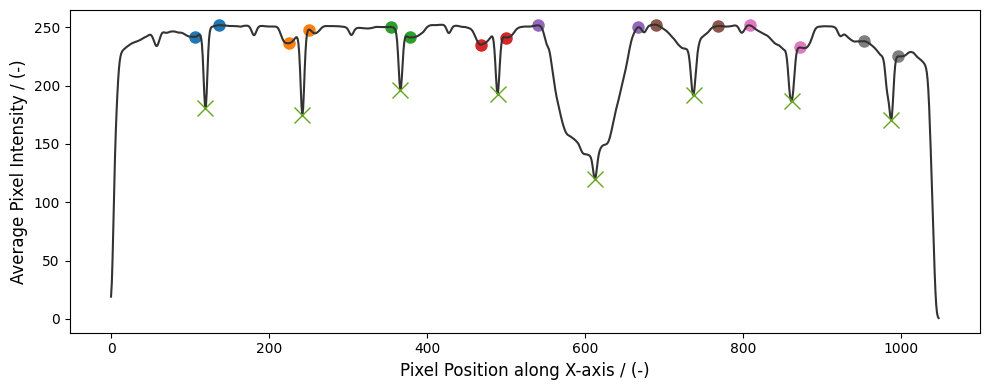

In [52]:
from scipy.signal import find_peaks, find_peaks_cwt, argrelextrema

from scipy.ndimage import gaussian_filter1d

mean_intensity = np.mean(th4, axis=0)
smoothed_intensity = mean_intensity
smoothed_intensity = gaussian_filter1d(mean_intensity, sigma=2)
inverse_intensity = - smoothed_intensity

# peaks, _ = find_peaks(inverse_intensity, height= -50)

# find peaks based on distance between on busbars
# peaks, _ = find_peaks(inverse_intensity, distance = 115)

# find peaks based on prominence
peaks, _ = find_peaks(inverse_intensity, prominence=20)
# Considering that the boundary pixel value tends to be 0, this affects the slope value to be found
# Here we set it to 20
Boundary_value = 20

widths = []
zero_slope_points = []
for peak in peaks:
    left = peak
    right = peak    
    while left > Boundary_value and np.abs(smoothed_intensity[left] - smoothed_intensity[left - 1]) > 0.05:
       left -= 1
    while right < len(smoothed_intensity) - Boundary_value - 1 and np.abs(smoothed_intensity[right] - smoothed_intensity[right + 1]) > 0.05:
       right += 1
    zero_slope_points.append((left, right))

       # 计算宽度
    width = right - left
    widths.append(width)

plt.figure(figsize=(10, 4)) 

for i, (width, (left, right)) in enumerate(zip(widths, zero_slope_points)):
   print(f"Dark region {i+1}: width = {width} pixels")
   print(f"Left zero-slope point at x = {left}, Right zero-slope point at x = {right} , [{left}, {right}]")
   # 在图中标记斜率接近于零的点
   plt.plot([left, right], [smoothed_intensity[left], smoothed_intensity[right]], 'o',markersize='8')
plt.plot(smoothed_intensity, color='#333333', label='Smoothed Intensity')
plt.plot(peaks, smoothed_intensity[peaks], "x", markersize='12', markeredgecolor='#66A61E' ,label='Dark Region Centers')
plt.xlabel('Pixel Position along X-axis / (-)',fontsize=12)
plt.ylabel('Average Pixel Intensity / (-)',fontsize=12)

plt.tight_layout()
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, \
    wspace=None, hspace=0.45)



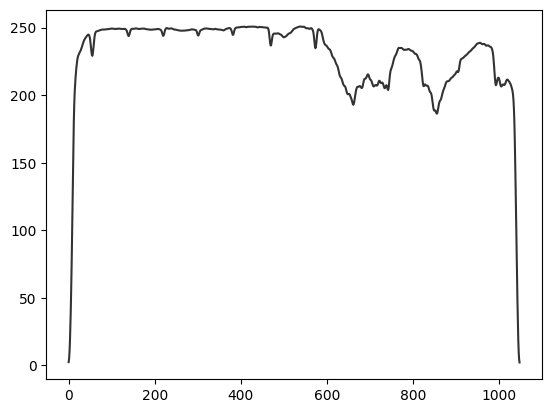

In [53]:
mean_intensity_y = np.mean(th4, axis=1)
smoothed_intensity_y = mean_intensity_y
smoothed_intensity_y = gaussian_filter1d(mean_intensity_y, sigma=2)
inverse_intensity_y = - smoothed_intensity_y

plt.plot(smoothed_intensity_y, color='#333333', label='Smoothed Intensity')

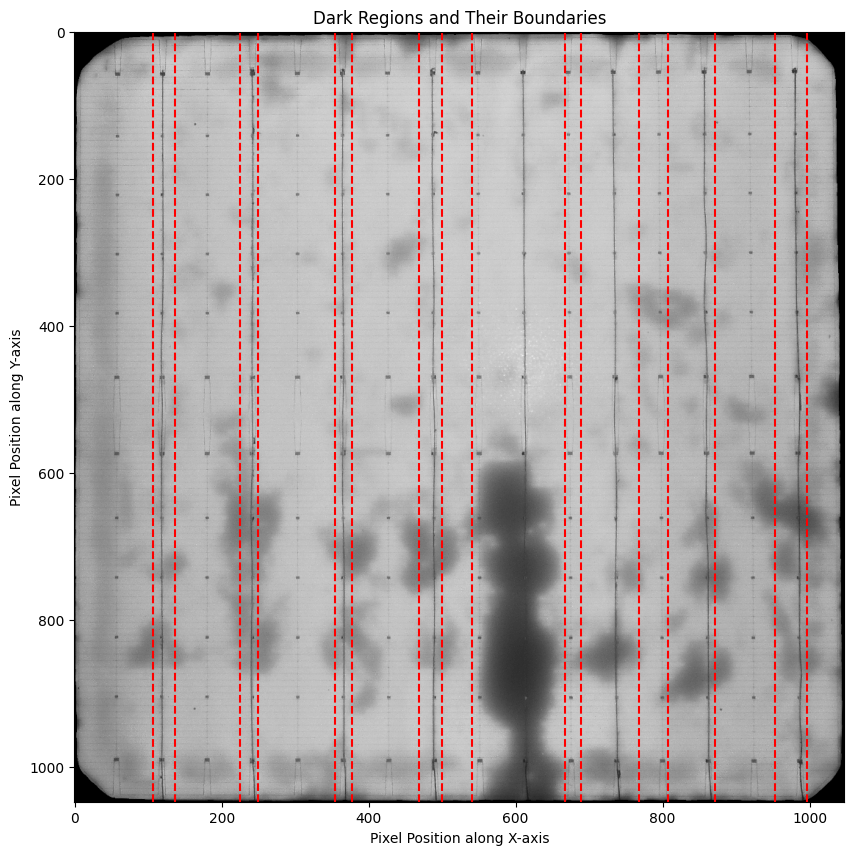

In [54]:
plt.figure(figsize=(10, 10)) 
plt.imshow(new_img, cmap='gray')
for i, (left, right) in enumerate(zero_slope_points):
   peak = peaks[i]
   plt.axvline(x=left, color='red', linestyle='--')
   plt.axvline(x=right, color='red', linestyle='--')
   # plt.axvline(x=peak, color='green', linestyle='-')

    
plt.title('Dark Regions and Their Boundaries')
plt.xlabel('Pixel Position along X-axis')
plt.ylabel('Pixel Position along Y-axis')
plt.show()

In [55]:
peaks

array([119, 242, 366, 489, 612, 737, 861, 987])

In [56]:
len(peaks)

8

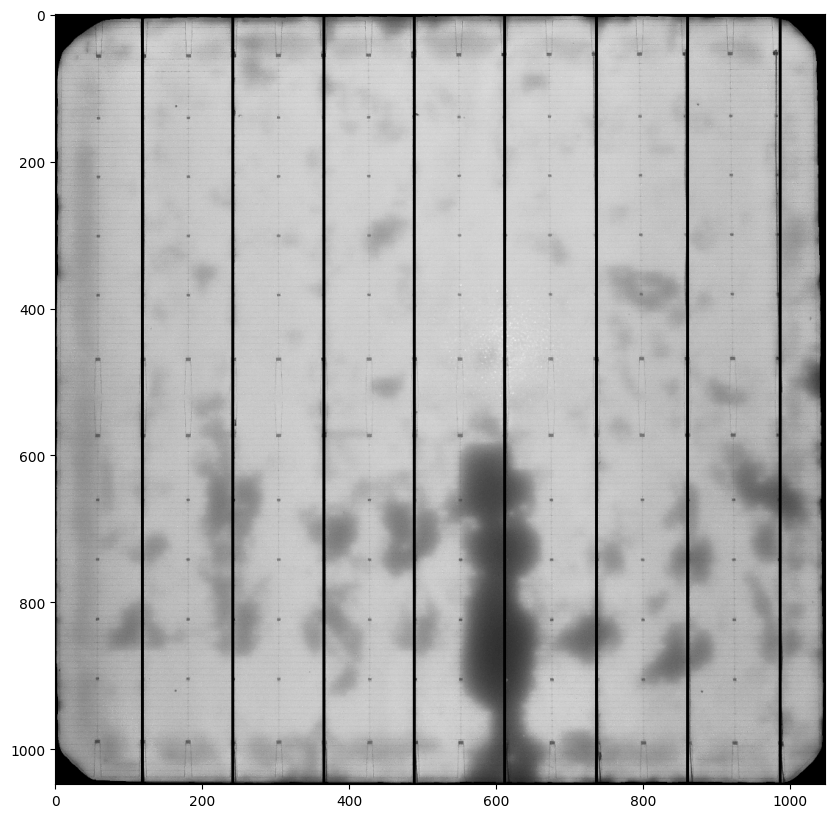

In [57]:
mask_busbar = np.ones(img_rot_1048.shape[:2], dtype=np.uint8)

lines_box_1 =[peaks[0]-2, 0, peaks[0]+2, 1048]
lines_box_1_np = np.array(lines_box_1)

lines_boxes = []
for i in range(len(peaks)):
    new_a = peaks[i]-2
    new_c = peaks[i]+2
    new_box = [new_a, 0, new_c, 1048]
    lines_boxes.append(new_box)
    mask_busbar[0:1048, new_a : new_c] = 0
    masked_image = cv2.bitwise_and(img_rot_1048, img_rot_1048, mask=mask_busbar)


plt.figure(figsize=(10, 10))
plt.imshow(img_rot_1048,'gray')
plt.imshow(masked_image, cmap='gray')

box_1 = [117, 0, 121, 1048]
box_2 = [240, 0, 244, 1048]
box_3 = [364, 0, 368, 1048]
box_4 = [487, 0, 491, 1048]
box_5 = [610, 0, 614, 1048]
box_6 = [735, 0, 739, 1048]
box_7 = [859, 0, 863, 1048]
box_8 = [985, 0, 989, 1048]


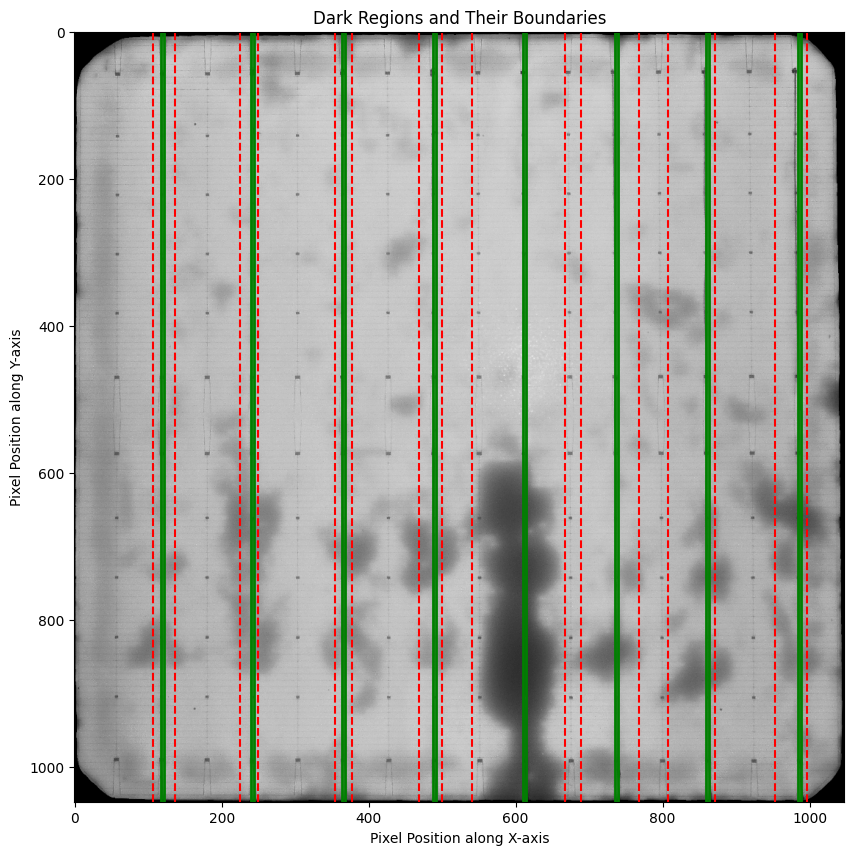

In [58]:
# busbar_box 可视化
mask_busbar = np.ones(img_rot_1048.shape[:2], dtype=np.uint8)

lines_box_1 =[peaks[0]-2, 0, peaks[0]+2, 1048]
lines_box_1_np = np.array(lines_box_1)

lines_boxes = []
for i in range(len(peaks)):
    new_a = peaks[i]-2
    new_c = peaks[i]+2
    new_box = [new_a, 0, new_c, 1048]
    lines_boxes.append(new_box)
    mask_busbar[0:1048, new_a : new_c] = 0
    masked_image = cv2.bitwise_and(img_rot_1048, img_rot_1048, mask=mask_busbar)

plt.figure(figsize=(10, 10))
plt.imshow(img_rot_1048,'gray')
for i, box_n in enumerate(lines_boxes):
    print(f'box_{i+1} = {box_n}')
    lines_box_n = np.array(box_n)
    show_box(lines_box_n, plt.gca())

for i, (left, right) in enumerate(zero_slope_points):
   peak = peaks[i]
   plt.axvline(x=left, color='red', linestyle='--')
   plt.axvline(x=right, color='red', linestyle='--')
   # plt.axvline(x=peak, color='green', linestyle='-')
    
plt.title('Dark Regions and Their Boundaries')
plt.xlabel('Pixel Position along X-axis')
plt.ylabel('Pixel Position along Y-axis')
plt.show()

In [59]:
# peak_raw_img_smoothed: array([ 60, 175, 291, 407, 523, 640, 756, 872, 986])
# peak_th1_img_smoothed: array([ 59, 175, 291, 407, 523, 640, 756, 873, 986])
# peak_th2_img_smoothed: array([ 60, 176, 291, 407, 523, 640, 756, 872, 986])
# peak_th3_img_smoothed: array([ 60, 176, 291, 407, 523, 640, 756, 872, 986])
# peak_th4_img_smoothed: array([ 60, 175, 291, 407, 523, 640, 756, 873, 986])
# peak_th5_img_smoothed: array([ 60, 175, 291, 407, 523, 640, 756, 873, 986])

In [60]:
new_img = cv2.imread(dir_path + filename[0:-4] + '_transform.png')
# new_img = cv2.imread(dir_path+filename[0:-4]+'.png')
analysis_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)
analysis_img_busbar = analysis_img[mask_busbar == 0]
analysis_img_non_busbar = analysis_img[mask_busbar == 1]

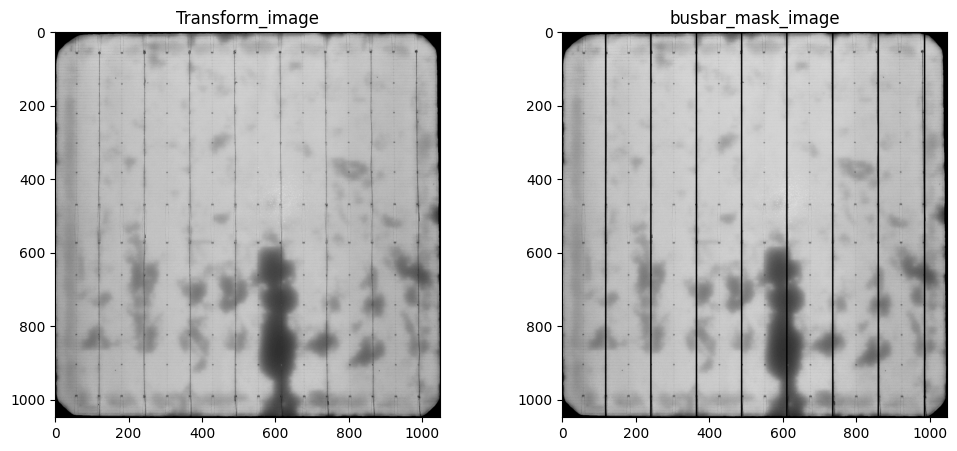

In [61]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.title('Transform_image')
plt.imshow(img_rot_1048,'gray')

plt.subplot(1, 2, 2)
plt.title('busbar_mask_image')
plt.imshow(masked_image,'gray')

total percent of busbar is 4.89 % , and corrosion is 30.54 %


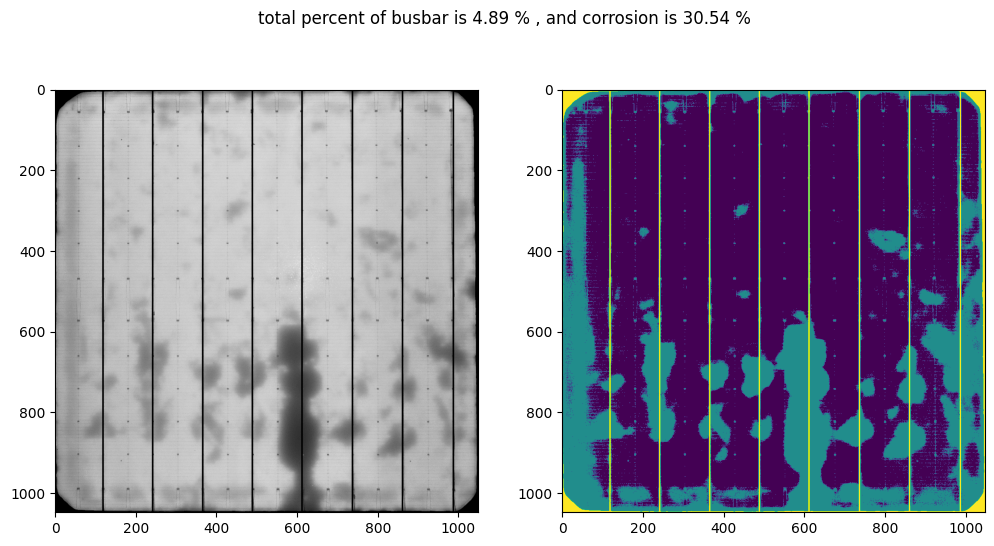

In [62]:
analysis_img = masked_image

background = 1
retal = cv.mean(analysis_img)
# corrosion_thres = 125
corrosion_thres = retal[0]

# counting the number of pixels
number_of_total_pix = np.sum(analysis_img <= 255)
number_of_busbar_pix = np.sum(analysis_img < background)
number_of_good_pix = np.sum(analysis_img > corrosion_thres)
busbar_ratio = number_of_busbar_pix/number_of_total_pix*100
corrosion_ratio = (1-number_of_good_pix/number_of_total_pix)*100
# print('total ratio of busbar is ', number_of_busbar_pix/number_of_total_pix, ', and total ratio of corrosion is ', 1-number_of_good_pix/number_of_total_pix)

#create a mask based on thresholds
corr_mask =np.zeros(np.shape(analysis_img))
for i in range(0, np.shape(analysis_img)[0]):
    for j in range(0, np.shape(analysis_img)[1]):
        if analysis_img[i,j]< background:
            corr_mask[i,j] = 255
        elif analysis_img[i,j] > corrosion_thres:
            corr_mask[i,j] = 0
        else:
            corr_mask[i,j] = 125
# plt.figure(figsize=(20, 10))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(analysis_img,cmap='gray')
ax2.imshow(corr_mask)
fig.suptitle('total percent of busbar is '+ str('%.2f' % busbar_ratio) + ' % , and corrosion is '+ str('%.2f' % corrosion_ratio) + ' %')
print('total percent of busbar is '+ str('%.2f' % busbar_ratio) + ' % , and corrosion is '+ str('%.2f' % corrosion_ratio) + ' %')

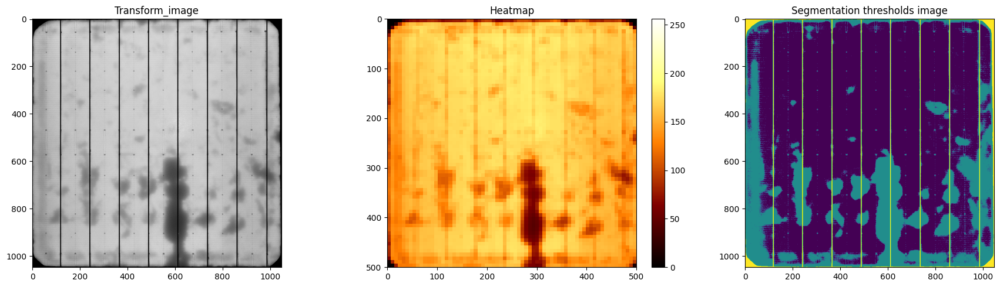

In [63]:
# heatmap plt
import matplotlib.colors as mcolors

grid_size = 15
np_img = np.asarray(cv2.imread(dir_path + filename[0:-4] + '_transform.png'))

height, width, _ =  np_img.shape
grid_height = height // grid_size 
grid_width = width // grid_size 

heatmap = np.zeros((grid_height,grid_width))

for i in range(grid_height):
    for j in range(grid_width):
        start_h = i * grid_size
        end_h = (i + 1) * grid_size
        start_w = j * grid_size
        end_w = (j + 1) * grid_size

        grid_pixels = np_img[start_h:end_h, start_w:end_w, : ]
        avg_value = np.mean(grid_pixels)

        heatmap[i , j] = avg_value

# Grayscale value
img = new_img.copy()

greyScale_map = cv.calcHist([img], [0], None, [256], [0, 256]).squeeze()

plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
plt.title('Transform_image')
plt.imshow(analysis_img,cmap='gray')
# plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Segmentation thresholds image')
plt.imshow(corr_mask)
# plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Segmentation thresholds image')
plt.imshow(heatmap, cmap='afmhot', interpolation='nearest', norm=mcolors.Normalize(vmin=0,vmax=256),extent=[0,500,500,0])
plt.colorbar(fraction=0.05, pad=0.05)
plt.title('Heatmap')
# plt.axis('off')

'''
plt.subplot(2, 1, 2)
plt.bar(range(len(greyScale_map)), greyScale_map, color='gray')
plt.title('Pixel Intensity Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
'''
plt.tight_layout()
plt.show()


In [64]:
# healthiness calculations
img_filtered = np.where(masked_image < 1, 0, masked_image)

pixel_counts = np.bincount(img_filtered.flatten(),minlength=256)

#cv.minMaxLoc()函数原型
minVal, maxVal, minLoc, maxLoc = cv.minMaxLoc(masked_image)

print('The Max Pixel value of PV-EL image "'+ filename + '" is '+ str('%.2f' %  maxVal))

# The maximum pixel value is constant(255)
max_pixel_value = 255
# The maximum pixel value of the image(based on image)
# max_pixel_value = maxVal
total_pixels = masked_image.size
healthiness = np.sum(pixel_counts * np.arange(256)) / (max_pixel_value * total_pixels) * 100

print('The health of the PV-EL image "'+ filename + '" is '+ str('%.2f' % healthiness) + ' %.' )

The Max Pixel value of PV-EL image "test_4.jpg" is 221.00
The health of the PV-EL image "test_4.jpg" is 58.11 %.


In [65]:
import pandas as pd
df = pd.DataFrame(img_rot_1048)
df.describe()

,0,1,2,3,4,5,6,7,8,9,...,1038,1039,1040,1041,1042,1043,1044,1045,1046,1047
count,1048.0,1048.0,1048.000000,1048.000000,1048.000000,1048.000000,1048.000000,1048.000000,1048.000000,1048.000000,...,1048.000000,1048.000000,1048.000000,1048.000000,1048.000000,1048.000000,1048.000000,1048.000000,1048.0,1048.0
mean,0.0,0.0,34.735687,79.356870,101.102099,106.970420,108.576336,111.045802,116.313931,123.053435,...,89.639313,78.336832,72.044847,59.207061,41.287214,23.812023,12.622137,0.619275,0.0,0.0
std,0.0,0.0,46.588669,53.128689,43.527463,42.275646,41.440097,39.778539,40.178419,41.309707,...,52.571811,56.100981,56.500162,55.424489,50.403136,40.135229,29.739467,4.759858,0.0,0.0
min,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,0.0,0.0,0.000000,8.750000,92.000000,101.000000,104.000000,111.000000,118.000000,124.000000,...,59.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
50%,0.0,0.0,0.000000,100.000000,117.000000,123.000000,124.000000,123.500000,128.000000,137.000000,...,113.000000,108.000000,98.000000,79.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
75%,0.0,0.0,79.000000,123.000000,129.000000,133.000000,134.000000,133.000000,137.000000,144.000000,...,130.000000,126.000000,124.250000,114.000000,99.000000,58.250000,0.000000,0.000000,0.0,0.0
max,0.0,0.0,157.000000,161.000000,156.000000,151.000000,154.000000,160.000000,158.000000,166.000000,...,153.000000,150.000000,157.000000,145.000000,136.000000,126.000000,113.000000,58.000000,0.0,0.0


In [66]:
# plt.savefig('/home/ne19695/Bingru Xin/2-data/Sam_PV_image/'+filename)